# OpenCV 기초

### 이미지파일 업로드 : car.jpg, mask.png, starwars.png

In [ ]:
from google.colab import files
upload_file = files.upload()

Saving car.jpg to car (1).jpg
Saving mask.png to mask (1).png
Saving starwars.png to starwars (1).png


### 라이브러리 임포트

In [ ]:
import numpy as np
import cv2

In [ ]:
print("OpenCV version: ", cv2.__version__)

OpenCV version:  4.1.2


### 이미지 읽기 : cv2.imread()

In [ ]:
img = cv2.imread("car.jpg")

# 이미지 shape 확인 : (높이, 넓이, 채널수)
print(f"height: {img.shape} pixels")
print(f"height: {img.shape[0]} pixels")
print(f"width: {img.shape[1]} pixels")
print(f"channels: {img.shape[2]}")

height: (720, 1280, 3) pixels
height: 720 pixels
width: 1280 pixels
channels: 3


In [ ]:
X, Y = 100, 200
(b,g,r) = img[100, 100]
print(f"Pixel at ({X}, {Y}) - Red: {r}, Green: {g}, Blue: {b}")

Pixel at (100, 200) - Red: 186, Green: 232, Blue: 255


### 이미지 출력 : cv2.imshow() 함수는 Colab에서 동작 안함

In [ ]:
cv2.imshow('My Car', img)

DisabledFunctionError: ignored

### 이미지 출력 : Matplotlib
- cv2에서는 이미지를 RGB 순서가 아닌 BGR 순처로 처리합니다.
- cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 함수로 색상 위치를 변경합니다.

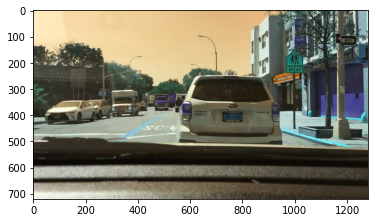

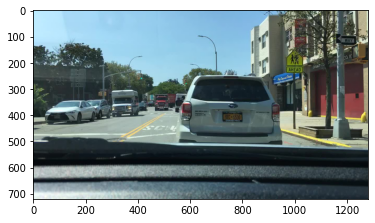

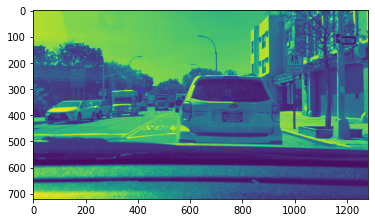

In [ ]:
import matplotlib.pyplot as plt

rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

img = cv2.imread("car.jpg")
plt.imshow(img)
plt.show()
plt.imshow(rgb_img)
plt.show()
plt.imshow(gray)
plt.show()

### 이미지 출력 : PIL 사용

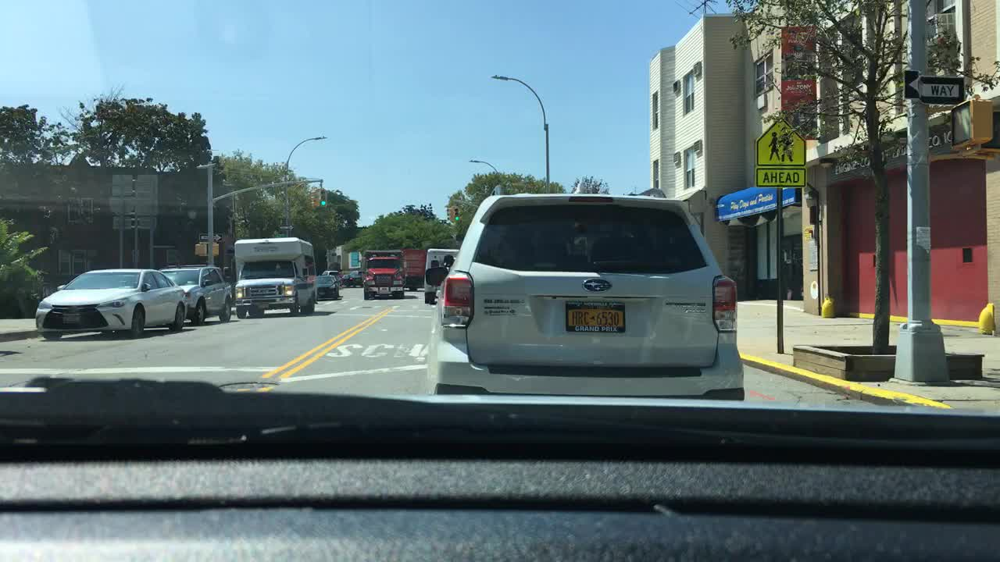

In [ ]:
import PIL.Image as Image

img = cv2.imread("car.jpg")
rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
Image.fromarray(rgb_img)

### 이미지 출력 : Colab cv2_imshow() 사용

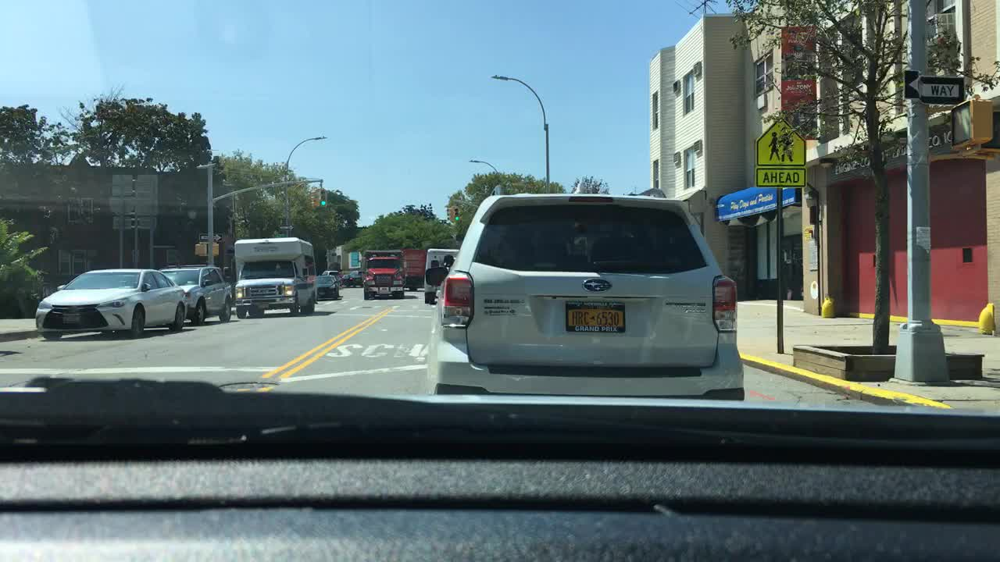

In [ ]:
from google.colab.patches import cv2_imshow

img = cv2.imread("car.jpg")
cv2_imshow(img)

### 이미지 생성 및 저장
cv2에서는 이미지를 RGB 순서가 아닌 BGR 순처로 처리합니다.

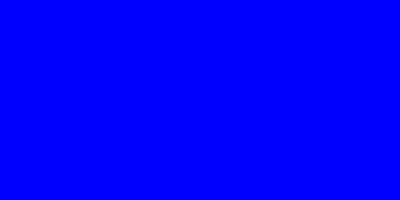

True

In [ ]:
# 이미지의 크기를 결정합니다
img_size = (200, 400)

# 이미지 정보를 가지는 행렬을 만듭니다
# 파란색 이미지이므로, 각 요소가 [255, 0, 0]인 200x400의 행렬을 만듭니다
new_img = np.array([[[255, 0, 0] for _ in range(img_size[1])] for _ in range(img_size[0])], dtype="uint8")

# 이미지를 표시합니다
cv2_imshow(new_img)

# 이미지를 파일로 저장합니다
cv2.imwrite("new_img.jpg", new_img)


### 이미지 트리밍
이미지를 나타내는 행렬의 일부를 꺼내면 트리밍이 됩니다.

In [ ]:
X = 710 #@param {type:"slider", min:0, max:1280, step:1}
Y = 370 #@param {type:"slider", min:0, max:720, step:1}
SIZE = 100 #@param {type:"slider", min:0, max:200, step:1}

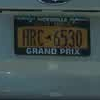

In [ ]:
img = cv2.imread("car.jpg")

# Crop cordination = image[y: y+h, x:x+w]
croped = img[Y:Y+SIZE, X:X+SIZE]
cv2_imshow(croped)

### 이미지 리사이즈
크기를 지정할 때는 (폭, 높이)의 순서

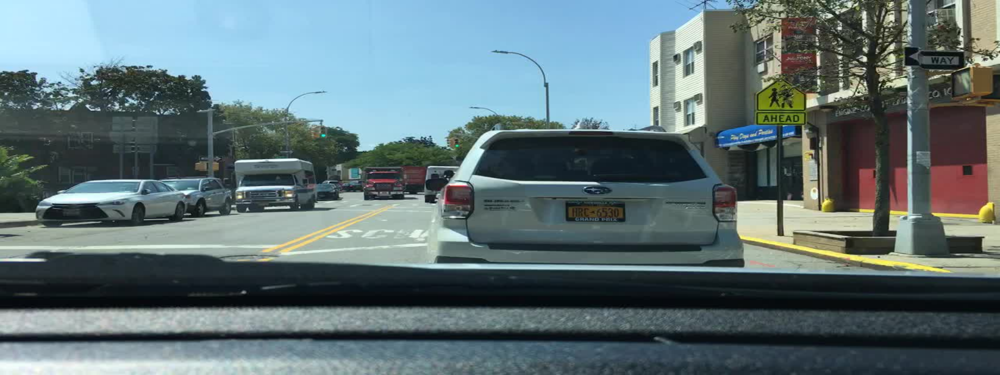

In [ ]:
img = cv2.imread("car.jpg")

my_img = cv2.resize(img, (img.shape[1] * 3, img.shape[0] * 2))
cv2_imshow(my_img)

### 이미지 회전 : warpAffine() 
- 첫번째 인수 :  회전 중심  
- 두번째 인수 :  회전 각도
- 세번째 인수 :  배율

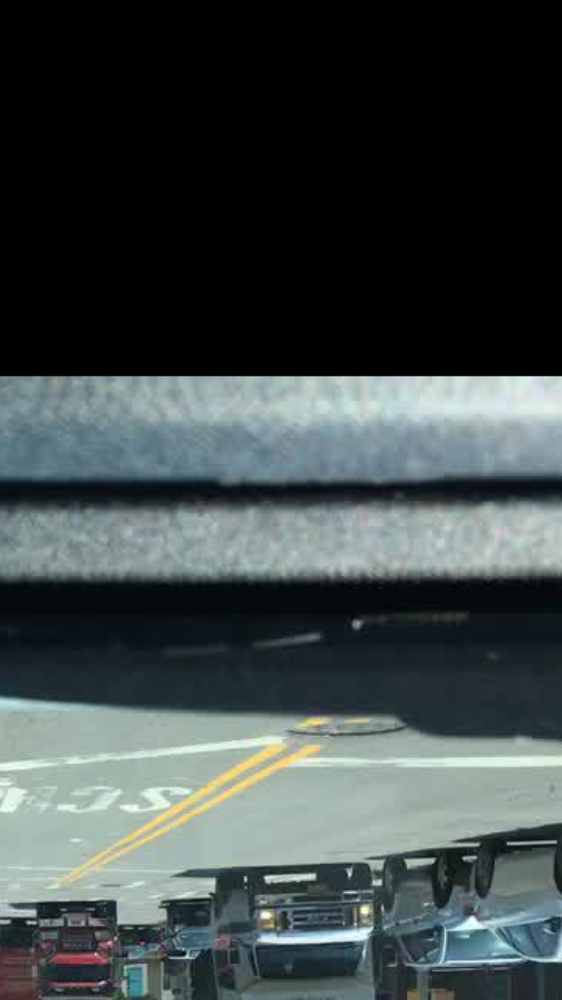

In [ ]:
img = cv2.imread("car.jpg")
mat = cv2.getRotationMatrix2D(tuple(np.array(img.shape[:2]) / 2), 180, 2.0)
my_img = cv2.warpAffine(img, mat, img.shape[:2])

cv2_imshow( my_img)

### 색상(색공간) 변환

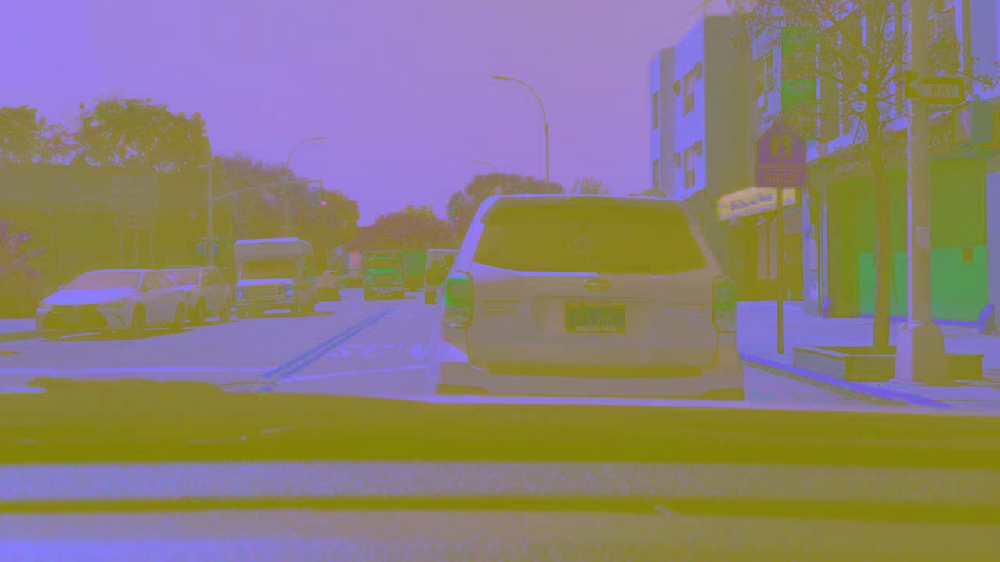

In [ ]:
img = cv2.imread("car.jpg")
my_img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

cv2_imshow(my_img)


### 임계값 처리(이진화)
이미지 용량을 줄이기 위해 일정값 이상을 모두 값은 값으로 처리
- 첫번째 인수 : 처리하는 이미지
- 두번째 인수 :  임계값
- 세번째 인수 :  최대값(maxvalue)
- 네번째 인수 :  THRESH_BINARY, THRESH_BINARY_INV, THRESH_TOZERO, THRESH_TRUNC, THRESH_TOZERO_INV 중 선택

* THRESH_BINARY: 픽셀값이 임계값을 초과하는 경우 해당 픽셀을 maxValue로 하고, 그 이외의 경우 0(검은색)     
*THRESH_BINARY_INV: 픽셀값이 임계값을 초과하는 경우 0으로 설정하고, 그 이외의 경우 maxValue  
* THRESH_TRUNC: 픽셀값이 임계값을 초과하는 경우 임계값으로 설정하고, 그 이외의 픽셀은 변경하지 않음
* THRESH_TOZERO: 픽셀값이 임계값을 초과하는 경우 변경하지 않고, 그 이외의 경우 0으로 설정  
* THRESH_TOZERO_INV: 픽셀값이 임계값을 초과하는 경우 0으로 설정하고, 그 이외의 경우 변경하지 않음  


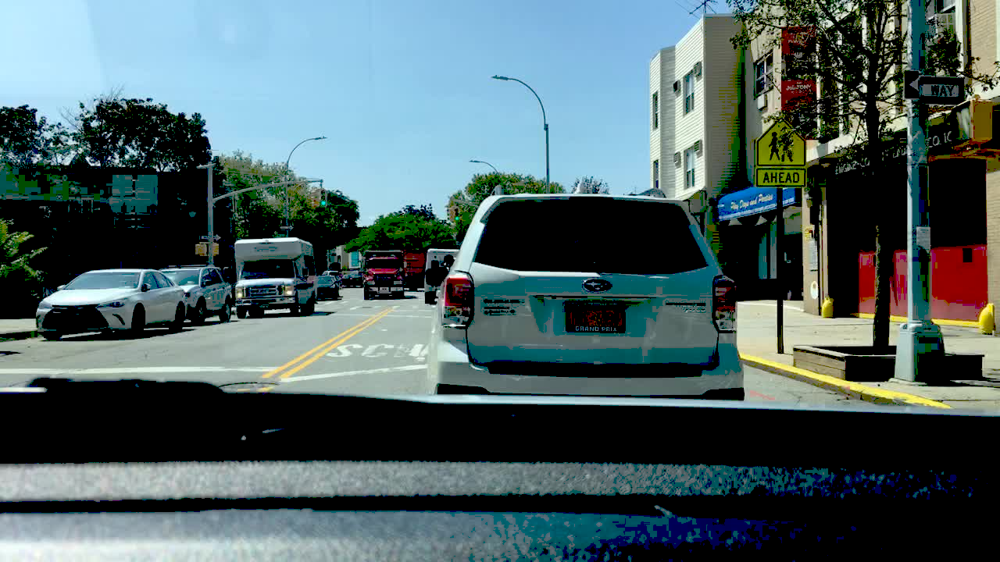

In [ ]:
img = cv2.imread("car.jpg")
retval, my_img = cv2.threshold(img, 75, 255, cv2.THRESH_TOZERO)

cv2_imshow(my_img)

### 이미지 마스킹

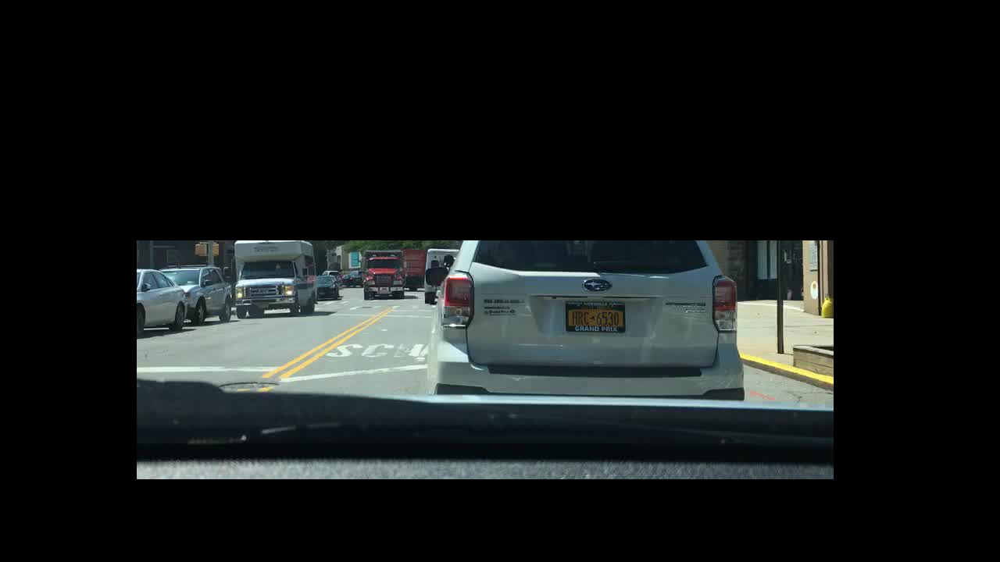

In [ ]:
img = cv2.imread("car.jpg")
mask = cv2.imread("mask.png", 0)

# 마스크 이미즈를 이미지와 같은 크기로 리사이즈
mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

my_img = cv2.bitwise_and(img, img, mask = mask)

cv2_imshow(my_img)

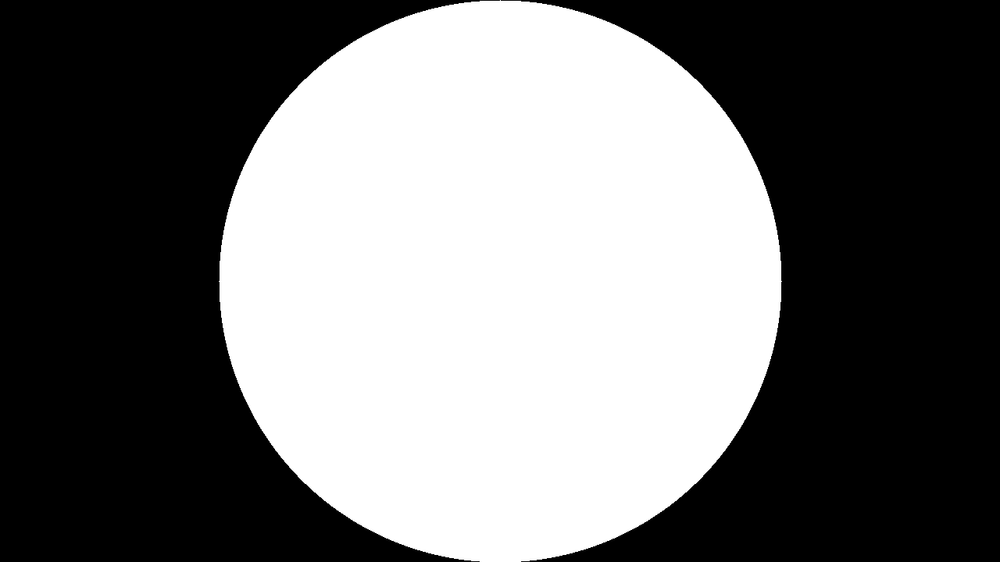

In [ ]:
(height, width) = img.shape[:2]
center = (width // 2, height // 2)

mask = np.zeros(img.shape[:2], dtype='uint8')
cv2.circle(mask, center, int(height/2), (255, 255, 255), -1)
cv2_imshow(mask)

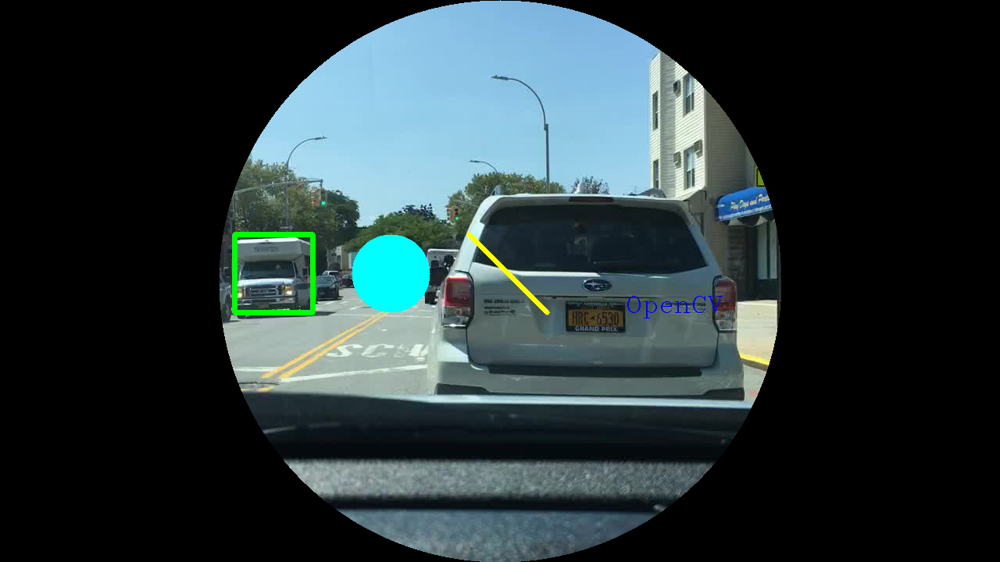

In [ ]:
masked = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(masked)

### 흐림효과 적용
- 첫번째 인수 :  원본 이미지
- 두번째 인수 :  n x n(마스크 크기)에서 n값을 지정(n은 홀수) 
- 세번째 인수 :  x축 방향의 편차(일반적으로 0 지정)

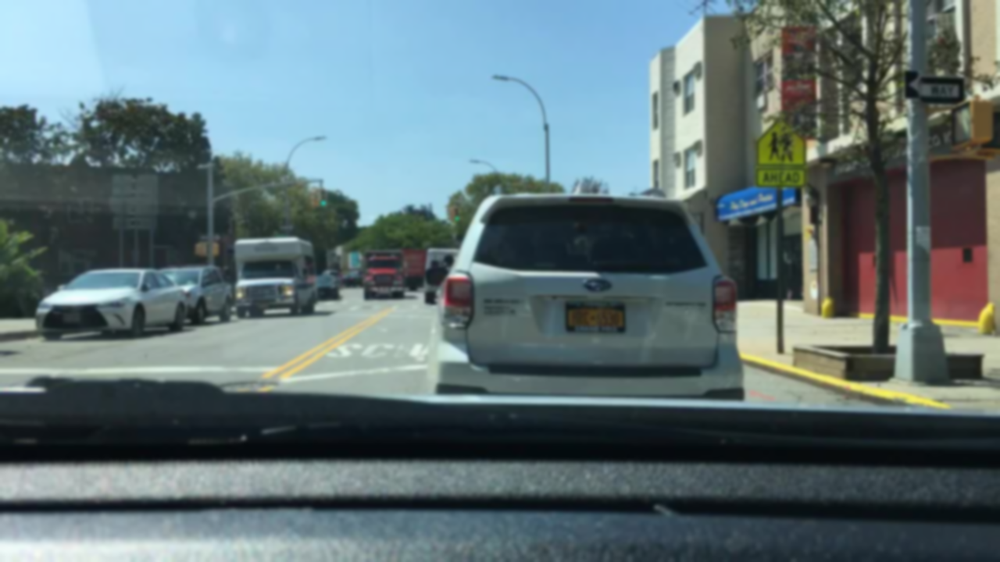

In [ ]:
my_img = cv2.GaussianBlur(img, (11, 11), 0)
cv2_imshow(my_img)

### 노이즈 제거

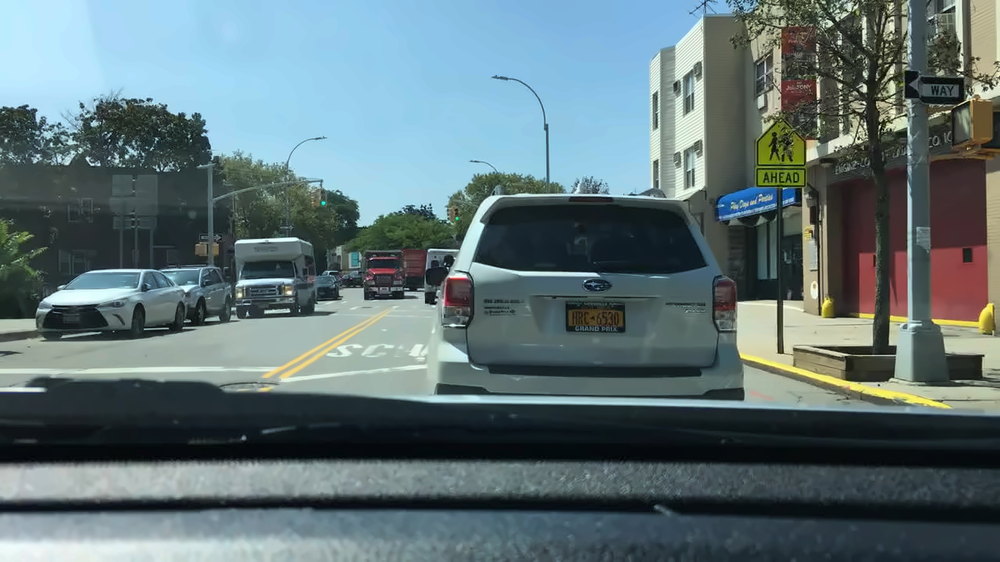

In [ ]:
my_img = cv2.fastNlMeansDenoisingColored(img)
cv2_imshow(my_img)

### 이미지 팽창과 침식

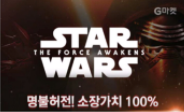

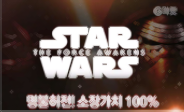

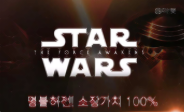

In [ ]:
img = cv2.imread("starwars.png")

# 필터 정의
filt = np.array([[0, 1, 0],
                 [1, 0, 1],
                 [0, 1, 0]], np.uint8)

# 팽창 처리합니다
img_dilate = cv2.dilate(img, filt)
img_erod = cv2.erode(img, filt)
cv2_imshow(img)
cv2_imshow(img_dilate)
cv2_imshow(img_erod)

# 도형, 텍스트 추가

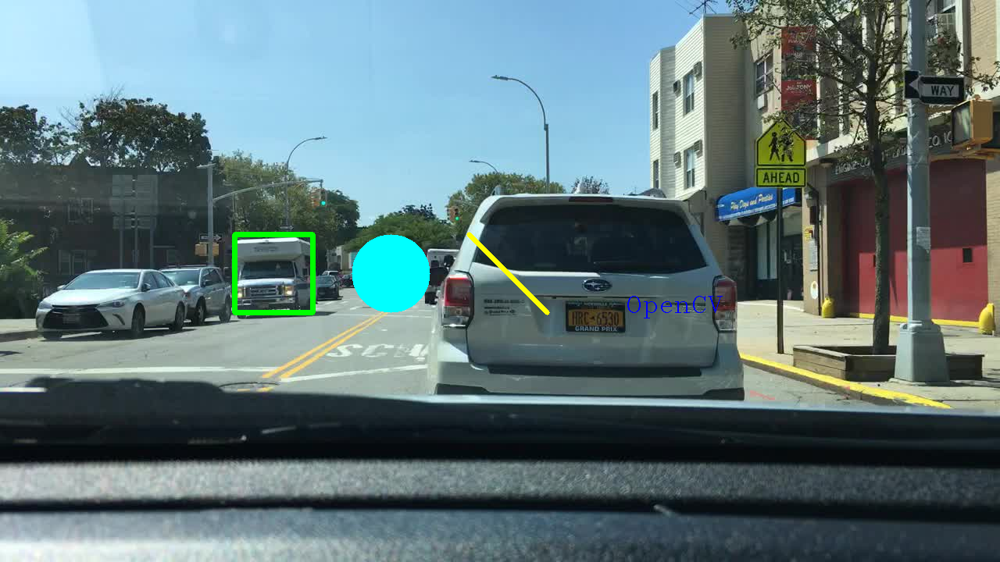

In [ ]:
img = cv2.imread("car.jpg")

X, Y = 100, 300

cv2.rectangle(img, (X+SIZE*2, Y), (X+SIZE*3, Y+SIZE), (0,255, 0), 5)

radius = int(SIZE/2)
cv2.circle(img, (X+SIZE*4, Y+radius), radius, (255,255, 0), -1)

cv2.line(img, (X+SIZE*5, Y), (X+SIZE*6, Y+SIZE), (0, 255, 255), 5)

cv2.putText(img, 'OpenCV', (X+SIZE*7, Y+SIZE), cv2.FONT_HERSHEY_COMPLEX, 1, (255, 0, 0))

cv2_imshow(img)

True

### 윤곽선 그리기

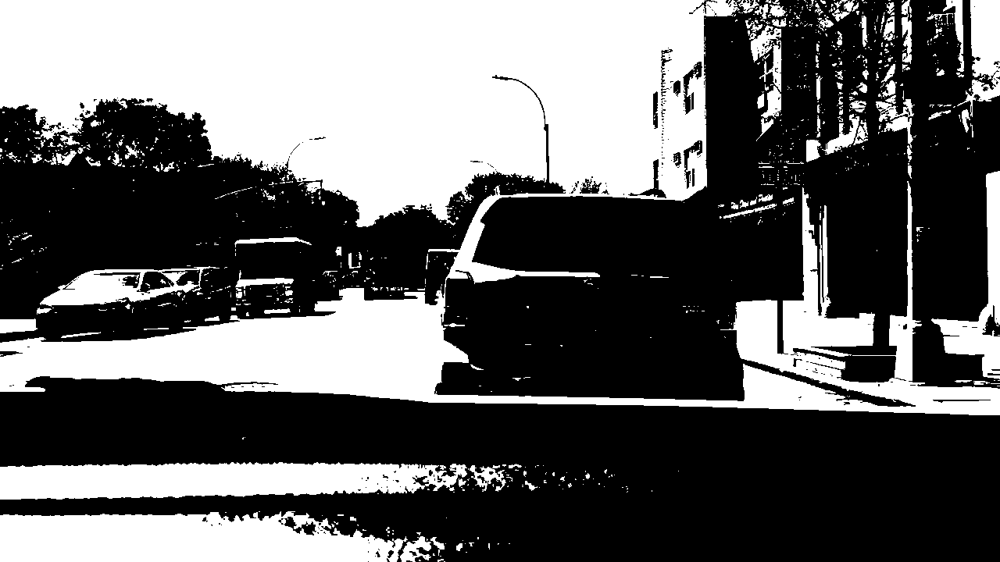

In [ ]:
ret, thresh = cv2.threshold(gray, 127, 255, 0)
cv2_imshow(thresh)

In [ ]:
contours, hierachy = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

In [ ]:
contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]

In [ ]:
back = np.zeros((height, width, 3), np.uint8)

10


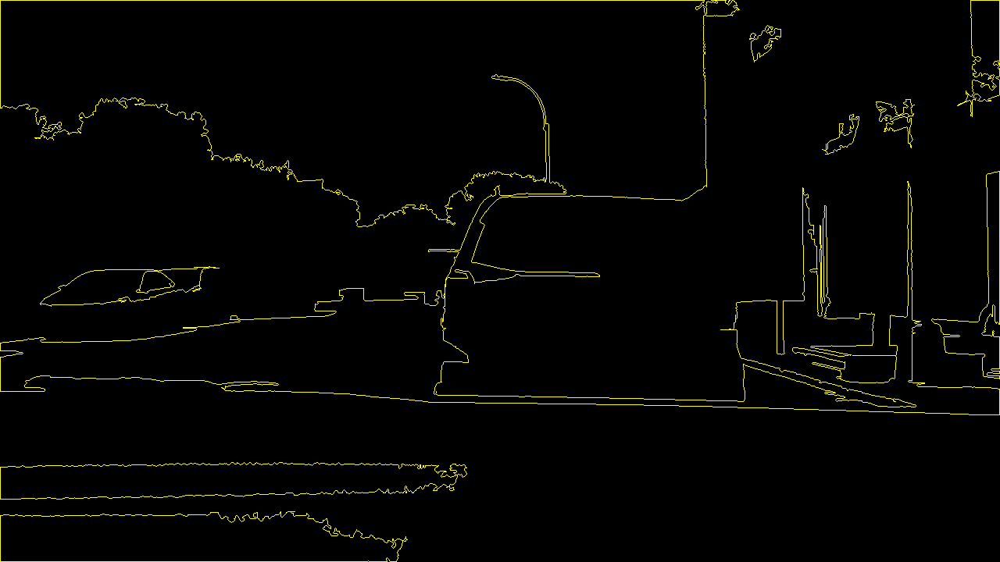

In [ ]:
contours, hierachy = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key = cv2.contourArea, reverse = True)[:10]
print(len(contours))
back = np.zeros((height, width, 3), np.uint8)
for i in range(len(contours)):
    cv2.drawContours(back, contours, i, (0, 255, 255))
cv2_imshow(back)

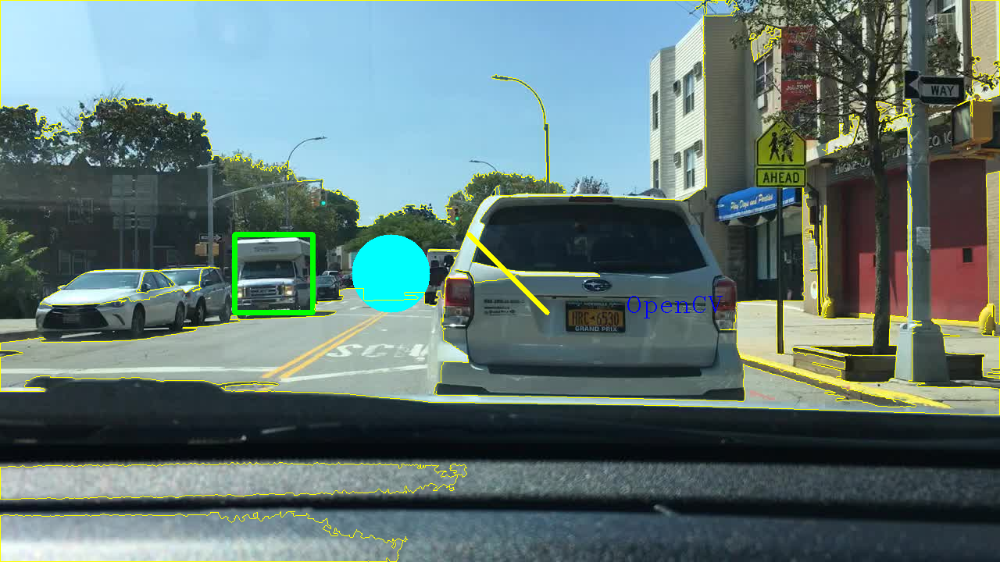

In [ ]:
for i in range(len(contours)):
    cv2.drawContours(img, contours, i, (0, 255, 255))
cv2_imshow(img)

### 이미지 저장

In [ ]:
cv2.imwrite('car-copy.jpg', img)

True

In [ ]:
def download(path):
    try:
        from google.colab import files
        files.download(path)
    except ImportError:
        import os
        print('Error download: ', os.path.join(os, getcwd(), path))

In [ ]:
download('car-copy.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>